<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Обзор-данных" data-toc-modified-id="Обзор-данных-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Обзор данных</a></span></li><li><span><a href="#Предобработка" data-toc-modified-id="Предобработка-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Предобработка</a></span></li><li><span><a href="#Первичный-анализ-данных" data-toc-modified-id="Первичный-анализ-данных-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Первичный анализ данных</a></span></li><li><span><a href="#Анализ-воронки-событий" data-toc-modified-id="Анализ-воронки-событий-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Анализ воронки событий</a></span></li><li><span><a href="#Анализ-A/B-теста" data-toc-modified-id="Анализ-A/B-теста-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Анализ A/B-теста</a></span><ul class="toc-item"><li><span><a href="#Проверка-значимости-различий-контрольных-групп" data-toc-modified-id="Проверка-значимости-различий-контрольных-групп-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Проверка значимости различий контрольных групп</a></span></li><li><span><a href="#Проверка-значимости-различий-с-группой-B" data-toc-modified-id="Проверка-значимости-различий-с-группой-B-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Проверка значимости различий с группой B</a></span></li></ul></li><li><span><a href="#Вывод" data-toc-modified-id="Вывод-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Вывод</a></span></li></ul></div>

# Исследование поведения пользователей мобильного приложения

Исследование направлено на анализ пользовательского поведения для мобильного приложения стартапа, который продаёт продукты питания.

Цели исследования:
* Анализ воронки продаж
* Анализ результатов A/A/B-эксперимента по замене шрифтов во всём приложении

In [1]:
#импорт библиотек
import pandas as pd
import numpy as np
from scipy import stats as st
import math as mth

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from functools import reduce

In [2]:
plt.style.use('seaborn-whitegrid')

In [3]:
import warnings
warnings.filterwarnings('ignore')

## Обзор данных

In [4]:
#запись данных в переменную
data = pd.read_csv('logs_exp.csv', sep='\t')

In [5]:
data

,EventName,DeviceIDHash,EventTimestamp,ExpId
0,MainScreenAppear,4575588528974610257,1564029816,246
1,MainScreenAppear,7416695313311560658,1564053102,246
2,PaymentScreenSuccessful,3518123091307005509,1564054127,248
3,CartScreenAppear,3518123091307005509,1564054127,248
4,PaymentScreenSuccessful,6217807653094995999,1564055322,248
...,...,...,...,...
244121,MainScreenAppear,4599628364049201812,1565212345,247
244122,MainScreenAppear,5849806612437486590,1565212439,246
244123,MainScreenAppear,5746969938801999050,1565212483,246
244124,MainScreenAppear,5746969938801999050,1565212498,246


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 244126 entries, 0 to 244125
Data columns (total 4 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   EventName       244126 non-null  object
 1   DeviceIDHash    244126 non-null  int64 
 2   EventTimestamp  244126 non-null  int64 
 3   ExpId           244126 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 7.5+ MB


In [7]:
print('События в логе:', data['EventName'].unique())

События в логе: ['MainScreenAppear' 'PaymentScreenSuccessful' 'CartScreenAppear'
 'OffersScreenAppear' 'Tutorial']


In [8]:
print('ID проводимых экспериментов:', data['ExpId'].unique())

ID проводимых экспериментов: [246 248 247]


In [9]:
print('Обнаружено дубликатов:', data.duplicated().sum())

Обнаружено дубликатов: 413


- Мы имеем данные лога событий, содержащие информацию о названии события, уникальном идентификаторе пользователя, времени события и номере эксперимента;
- Таблица содержит 244 126 строк (не уникальных событий);
- Данные не содержат пропусков, названия событий и номера экспериментов имеют корректные значения;
- Были обнаружены дубликаты (413 строки) и не соответствующий тип данных для даты и времени. Исправим это на этапе предобработки.

## Предобработка

Скорректируем формат даты и времени и добавим отдельный столбец с датой. Также, для удобства, переименуем столбцы.

In [10]:
#переименование столбцов
data.columns = ['event_name', 'user_id', 'event_time', 'exp_id']

In [11]:
#изменение формата для даты и времени на datetime
data['event_time'] = pd.to_datetime(data['event_time'], unit='s')

In [12]:
#новый столбец с датой
data['event_date'] = data['event_time'].astype('datetime64[D]')

In [13]:
#проверка корректности замены
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 244126 entries, 0 to 244125
Data columns (total 5 columns):
 #   Column      Non-Null Count   Dtype         
---  ------      --------------   -----         
 0   event_name  244126 non-null  object        
 1   user_id     244126 non-null  int64         
 2   event_time  244126 non-null  datetime64[ns]
 3   exp_id      244126 non-null  int64         
 4   event_date  244126 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(2), object(1)
memory usage: 9.3+ MB


In [14]:
#рассмотрим данные с дубликатами
data[data.duplicated()]

,event_name,user_id,event_time,exp_id,event_date
453,MainScreenAppear,5613408041324010552,2019-07-30 08:19:44,248,2019-07-30
2350,CartScreenAppear,1694940645335807244,2019-07-31 21:51:39,248,2019-07-31
3573,MainScreenAppear,434103746454591587,2019-08-01 02:59:37,248,2019-08-01
4076,MainScreenAppear,3761373764179762633,2019-08-01 03:47:46,247,2019-08-01
4803,MainScreenAppear,2835328739789306622,2019-08-01 04:44:01,248,2019-08-01
...,...,...,...,...,...
242329,MainScreenAppear,8870358373313968633,2019-08-07 19:26:44,247,2019-08-07
242332,PaymentScreenSuccessful,4718002964983105693,2019-08-07 19:26:45,247,2019-08-07
242360,PaymentScreenSuccessful,2382591782303281935,2019-08-07 19:27:29,246,2019-08-07
242362,CartScreenAppear,2382591782303281935,2019-08-07 19:27:29,246,2019-08-07


Дублирующие строки в данных не имеют очевидных закономерностей и, скорее всего, были получены из за технической ошибки при сборе логов. Дубликаты составляют 0.1% от всех данных - удалим эти строки из анализа.

In [15]:
data = data.drop_duplicates().reset_index(drop=True)

In [16]:
print('Обнаружено дубликатов:', data.duplicated().sum())

Обнаружено дубликатов: 0


## Первичный анализ данных

In [17]:
print('Событий в логе:', len(data['event_name']))

Событий в логе: 243713


In [18]:
print('Пользователей в логе:', data['user_id'].nunique())

Пользователей в логе: 7551


In [19]:
events_per_user = (
    data.groupby('user_id')
    .agg({'event_name':'count'})
    .rename(columns={'event_name':'event_count'})
    .reset_index()
)
print('Cреднее число событий на пользователя:', round(events_per_user['event_count'].mean()))
print('Медианное число событий на пользователя:', round(events_per_user['event_count'].median())) #новый код

Cреднее число событий на пользователя: 32
Медианное число событий на пользователя: 20


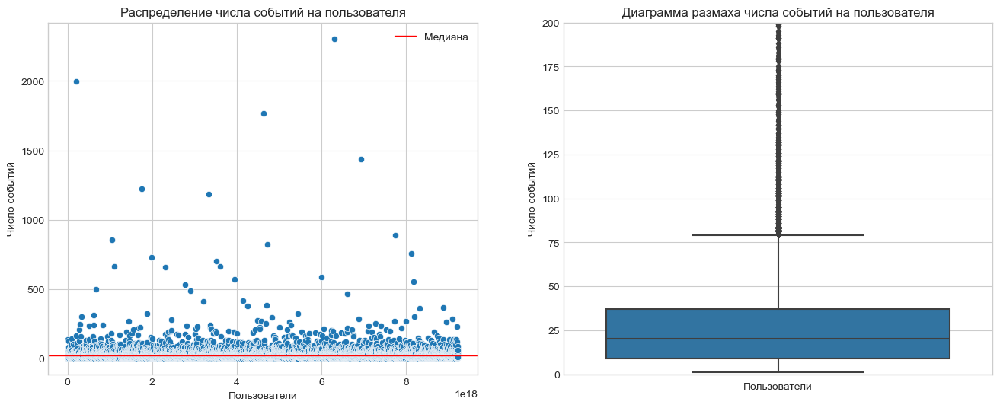

In [20]:
fig, axes = plt.subplots(1, 2, figsize=(16,6))

ax1 = sns.scatterplot(data=events_per_user, x='user_id', y ='event_count', ax=axes[0])
ax1.axhline(y=events_per_user['event_count'].median(), color='red', linewidth=1, label='Медиана')
ax1.set_title('Распределение числа событий на пользователя')
ax1.legend() 
ax1.set_ylabel('Число событий')
ax1.set_xlabel('Пользователи')

ax2 = sns.boxplot(data=events_per_user, y ='event_count', ax=axes[1])
ax2.set_title('Диаграмма размаха числа событий на пользователя')
ax2.set_ylabel('Число событий')
ax2.set_xlabel('Пользователи')
ax2.set_ylim(0, 200)
plt.show()

In [21]:
print('Максимальная дата в логе:', data['event_time'].max())
print('Минимальная дата в логе:', data['event_time'].min())

Максимальная дата в логе: 2019-08-07 21:15:17
Минимальная дата в логе: 2019-07-25 04:43:36


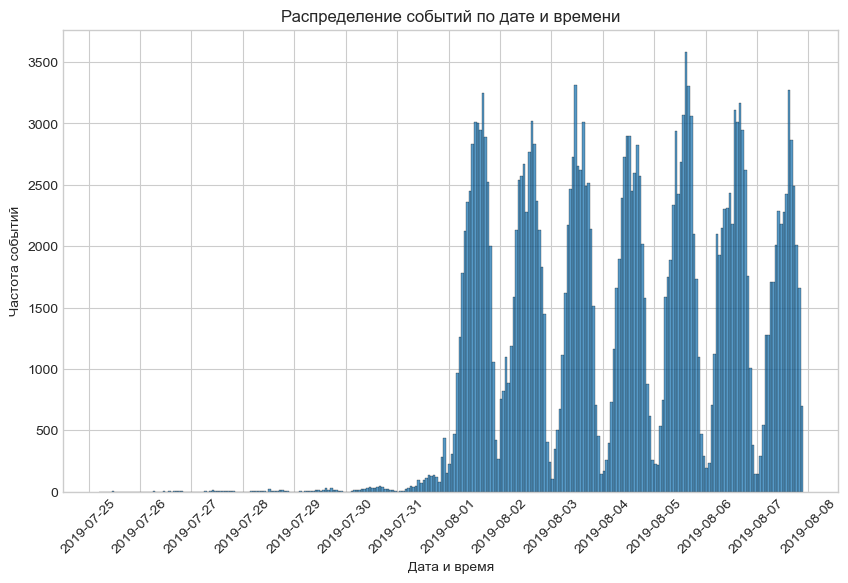

In [22]:
plt.figure(figsize=(10,6))
sns.histplot(data=data['event_time'], binwidth=0.05).xaxis.set_major_locator(mdates.DayLocator(interval=1))
plt.title('Распределение событий по дате и времени')
plt.xlabel('Дата и время')
plt.ylabel('Частота событий')
plt.xticks(rotation=45)
plt.show()

Мы располагаем данными за 14 дней с 25.07.2019 по 07.08.2019. При этом, данные за период до 1.08.2019 не полные. Так как при дальнейшем анализе по эти данным не получится сделать полноценные выводы, уберем их из набора данных.

In [23]:
actual_data = data.query('event_time >= "2019-08-01"')

In [24]:
actual_data.head()

,event_name,user_id,event_time,exp_id,event_date
2826,Tutorial,3737462046622621720,2019-08-01 00:07:28,246,2019-08-01
2827,MainScreenAppear,3737462046622621720,2019-08-01 00:08:00,246,2019-08-01
2828,MainScreenAppear,3737462046622621720,2019-08-01 00:08:55,246,2019-08-01
2829,OffersScreenAppear,3737462046622621720,2019-08-01 00:08:58,246,2019-08-01
2830,MainScreenAppear,1433840883824088890,2019-08-01 00:08:59,247,2019-08-01


In [25]:
print('Изначальное число событий в логе:', len(data['event_name']))
print('Событий в логе без старых данных:', len(actual_data['event_name']))
print('Доля потерянных данных', round((len(data['event_name']) - len(actual_data['event_name'])) / len(data['event_name']), 4))
print('')
print('Изначальное число пользователей в логе:', data['user_id'].nunique())
print('Пользователей в логе без старых данных:', actual_data['user_id'].nunique())
print('Доля потерянных данных', round((data['user_id'].nunique() - actual_data['user_id'].nunique()) / data['user_id'].nunique(), 4))

Изначальное число событий в логе: 243713
Событий в логе без старых данных: 240887
Доля потерянных данных 0.0116

Изначальное число пользователей в логе: 7551
Пользователей в логе без старых данных: 7534
Доля потерянных данных 0.0023


In [26]:
print('Распределение пользователей по экспериментальным группам:')
actual_data.pivot_table(index='exp_id', values='user_id', aggfunc='nunique')

Распределение пользователей по экспериментальным группам:


,user_id
exp_id,
246,2484
247,2513
248,2537


При первичном анализе было выявлено, что до 1.08.2019 мы имеем не полные данные. Удалив их из таблицы, мы потеряли 1% данных. После отсева информации, исследуемый период составляет с 1.08.2019 по 7.08.2019, событий в логе - 240 887, пользователей в логе - 7 534. По эксперементальным группам пользователи распределены равномерно.

## Анализ воронки событий

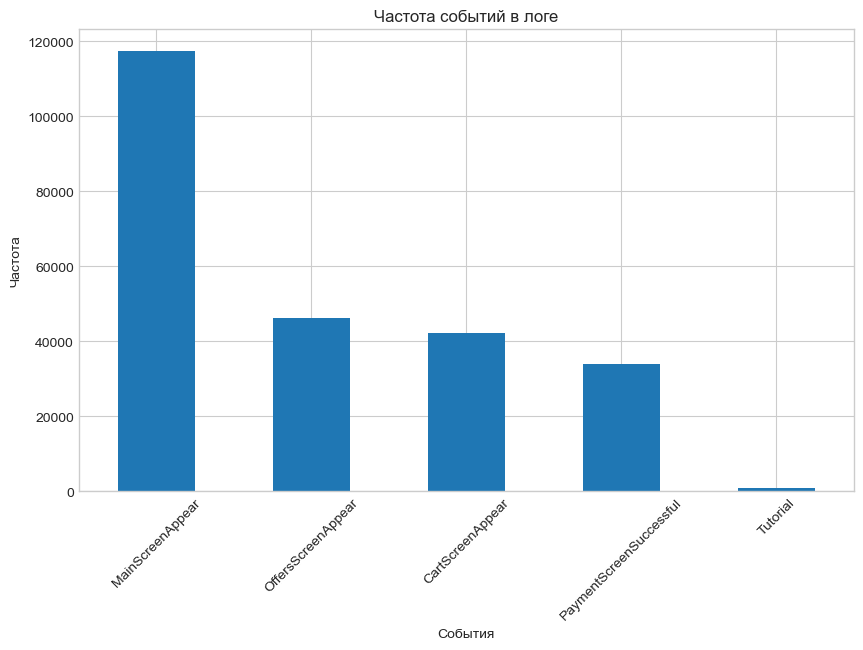

In [48]:
events = (
    actual_data.groupby('event_name')
    .agg({'user_id':'count'})
    .rename(columns={'user_id':'count'})
    .sort_values('count', ascending=False)
    .reset_index()
)

events.plot(x='event_name', kind='bar', figsize=(10,6), legend=False)
plt.title('Частота событий в логе')
plt.xlabel('События')
plt.ylabel('Частота')
plt.xticks(rotation=45)
plt.show()

События в логе:
* MainScreenAppear - открытие главной страницы
* Offers Screen Appear - открытие страницы с офертой (предложением)
* Cart Screen Appear - открытие страницы корзины
* Payment Screen Successful - открытие страницы с успешной оплатой
* Tutorial - ознакомление с инструкцией

Наиболее часто встречающееся событие - открытие главной страницы, реже всего открвалась страница с инструкцией.

In [28]:
#расчет распределения пользователей, совершивших каждое из событий
events_pivot = (
    actual_data.pivot_table(index='event_name', values='user_id', aggfunc='nunique')
    .sort_values('user_id', ascending=False)
    .reset_index()
)
events_pivot['share, %'] = round(events_pivot['user_id'] / len(actual_data['user_id'].unique()) * 100, 1)
events_pivot['conv, %'] = round(
    events_pivot['user_id'] / actual_data.query('event_name == "MainScreenAppear"')['user_id'].nunique() * 100, 1
)

events_pivot

,event_name,user_id,"share, %","conv, %"
0,MainScreenAppear,7419,98.5,100.0
1,OffersScreenAppear,4593,61.0,61.9
2,CartScreenAppear,3734,49.6,50.3
3,PaymentScreenSuccessful,3539,47.0,47.7
4,Tutorial,840,11.1,11.3


Событие "открытие главной страницы" случается не у всех пользователей - 98,5%, возможно, другие пользователи минуют этот этап переходя по прямой ссылке на товар. Страница с офертой открывалась у 61% пользователей, корзина - у 49,6%, а страницу с успешной оплатой 47% пользователей. Инструкцию открыло только 11,1% пользователей.

Преимущественно воронка событий соответствует порядку событий по частоте их появления в логе. Первым собитием будем считать открытие главной страницы, затем открытие страниц с офертой, корзины и страницы с успешной оплатой. Этап ознакомления с инструкцией исключим из воронки, так как его проходят далеко не все пользователи и он может занимать любую очередность в последовательности событий.

In [29]:
#исключение экрана с инструкцией из анализа воронки событий
events_pivot = events_pivot.query('event_name != "Tutorial"')

In [30]:
plt.figure(figsize=(12,7))
fig = px.funnel(events_pivot, x='conv, %', y='event_name')
fig.update_layout(
    title_text= 'Воронка событий',
    yaxis_title='Доля пользователей, дошедших c первого до последующего этапа воронки'    
)
fig.show()

<Figure size 1200x700 with 0 Axes>

In [31]:
#расчет доли пользователей, которые проходят на следующий шаг воронки от числа пользователей на предыдущем
events_pivot['shift'] = events_pivot['user_id'].shift(periods=1, axis=0, fill_value=events_pivot['user_id'][0])
events_pivot['conv_per_step, %'] = round((events_pivot['user_id'] / events_pivot['shift']) * 100,1)
events_pivot.drop('shift', axis='columns', inplace=True)
events_pivot

,event_name,user_id,"share, %","conv, %","conv_per_step, %"
0,MainScreenAppear,7419,98.5,100.0,100.0
1,OffersScreenAppear,4593,61.0,61.9,61.9
2,CartScreenAppear,3734,49.6,50.3,81.3
3,PaymentScreenSuccessful,3539,47.0,47.7,94.8


In [32]:
plt.figure(figsize=(12,7))
fig = px.funnel(events_pivot, x='conv_per_step, %', y='event_name')
fig.update_layout(
    title_text= 'Воронка событий',
    yaxis_title='Доля пользователей на определённом шаге к числу на предыдущем'    
)
fig.show()

<Figure size 1200x700 with 0 Axes>

В целом, до оплаты доходит 47% пользователей. Если рассмотреть конверсию в шаг, можно отметить, что после просмотра главного экрана, только 61% пользователей открывют станицу с офертой. На этом шаге теряется больше всего пользователей. После просмотра предложения 81% переходят в корзину и 94% из них оплачивают покупку, что говорит об отсутствии проблем с приложением у пользователей на данных этапах.

## Анализ A/B-теста

Рассмотрим распределение пользователей по эксперементальным группам. Все ользователи были разбиты на 3 группы: 2 контрольные со старыми шрифтами и одну экспериментальную — с новыми. Предстоит выяснить, какой шрифт лучше.

In [33]:
plt.figure(figsize=(12,7))
fig = (
    px.bar(actual_data.groupby('exp_id').agg({'user_id':'nunique'}).reset_index(), x='exp_id', y='user_id')
)
fig.update_layout(
    title_text= 'Распределение пользователей по экспериментальным группам',
    yaxis_title='Количество пользователей',
    xaxis_title='Экспериментальные группы'
)
fig.update_xaxes(dtick=1)
fig.show()

<Figure size 1200x700 with 0 Axes>

In [34]:
#построим таблицу с распределением пользователей в группах по событиям
def table_by_exp (exp):
    result = (
        actual_data.query('exp_id == @exp & event_name != "Tutorial"')
        .groupby('event_name')
        .agg({'user_id':'nunique'})
        .sort_values(by='user_id', ascending=False)
        .reset_index()
    )
    result['share'] = round(result['user_id'] / len(actual_data.query('exp_id == @exp')['user_id'].unique()), 2)
    return result

exp_list = [246, 247, 248]
exp246_pivot = table_by_exp(exp_list[0])
exp246_pivot.columns = ['event_name', 'users_246', 'share_246']

exp247_pivot = table_by_exp(exp_list[1])
exp247_pivot.columns = ['event_name', 'users_247', 'share_247']

exp248_pivot = table_by_exp(exp_list[2])
exp248_pivot.columns = ['event_name', 'users_248', 'share_248']

data_frames = [exp246_pivot, exp247_pivot, exp248_pivot]
exp_group_pivot = reduce(lambda  left,right: pd.merge(left,right,on=['event_name'], how='outer'), data_frames)
exp_group_pivot

,event_name,users_246,share_246,users_247,share_247,users_248,share_248
0,MainScreenAppear,2450,0.99,2476,0.99,2493,0.98
1,OffersScreenAppear,1542,0.62,1520,0.60,1531,0.60
2,CartScreenAppear,1266,0.51,1238,0.49,1230,0.48
3,PaymentScreenSuccessful,1200,0.48,1158,0.46,1181,0.47


In [35]:
#df_246 = exp_group_pivot[['event_name', 'share_246']].rename(columns={'share_246':'share'})
#df_246['exp'] = '246'

#df_247 = exp_group_pivot[['event_name', 'share_247']].rename(columns={'share_247':'share'})
#df_247['exp'] = '247'

#df_248 = exp_group_pivot[['event_name', 'share_248']].rename(columns={'share_248':'share'})
#df_248['exp'] = '248'

#df = pd.concat([df_246, df_247, df_248], axis=0)
#plt.figure(figsize=(12,7))
#fig = px.funnel(df, x='share', y='event_name', color='exp')
#fig.update_layout(
    #title_text= 'Воронка событий для эксперементальных групп',
    #yaxis_title='Доля пользователей, дошедших до каждого этапа воронки',
    #legend_title='Группы',
#)
#fig.show()

In [36]:
plt.figure(figsize=(12,7))
fig = go.Figure()

fig.add_trace(go.Funnel(
    name = '246',
    y = exp_group_pivot['event_name'],
    x = exp_group_pivot['users_246'],
    textinfo = 'value+percent initial'))

fig.add_trace(go.Funnel(
    name = '247',
    orientation = 'h',
    y = exp_group_pivot['event_name'],
    x = exp_group_pivot['users_247'],
    textposition = 'inside',
    textinfo = 'value+percent initial'))

fig.add_trace(go.Funnel(
    name = '248',
    orientation = 'h',
    y = exp_group_pivot['event_name'],
    x = exp_group_pivot['users_248'],
    textposition = 'inside',
    textinfo = 'value+percent initial'))

fig.update_layout(
    title_text= 'Воронка событий для эксперементальных групп',
    yaxis_title='Доля пользователей, дошедших до каждого этапа воронки',
    legend_title='Группы',
)
fig.show()

<Figure size 1200x700 with 0 Axes>

<div class="alert alert-block alert-success">✅ <b>Комментарий ревьюера:</b> Отличный график воронки с разделением на группы. Было бы здорово ещё добавить на него кол-во пользователей на каждом шаге :)
</div>

<div class="alert alert-info"> <b>Комментарий студента:</b> Добавила) (перестроила график через go) </div>

Число пользователей распределено по группам равномерно, а пользователи из разных групп имеют близкое распределение по событиям. По воронке событий, можно отметить, что лучше конвертируются в покупатели пользователи из группы 246, далее проверим значимость различий.

Перед проверкой статистическими критериями значимости различий между выборками, проверим их распределение на нормальность.

In [37]:
plt.figure(figsize=(12,7))
fig = go.Figure()
fig.add_trace(go.Histogram(x=actual_data.query('exp_id == 246')['event_time'], name='246'))
fig.add_trace(go.Histogram(x=actual_data.query('exp_id == 247')['event_time'], name='247'))
fig.add_trace(go.Histogram(x=actual_data.query('exp_id == 248')['event_time'], name='248'))

fig.update_layout(barmode='overlay')
fig.update_traces(opacity=0.5)

fig.update_layout(
    title_text= 'Распределений событий по дате для эксперентальных групп',
    yaxis_title='Количество событий',
    xaxis_title='Дата',
    legend_title='Группы'
)
fig.show()

<Figure size 1200x700 with 0 Axes>

Можно сказать, что данные в течение дня распределены нормально. Можно приступать к проверке гипотез о равенстве долей для различных групп с помощью z-критерия.

<div class="alert alert-block alert-success">✅ <b>Комментарий ревьюера:</b> Всё верно, хорошее решение проверить нормальность распределения :)
</div>

Так как мы планируем провести несколько проверок статистических гипотез, а именно 16 (сравненние двух контрольных групп по четырем событиям, сравнение каждой контрольной группы с эксперементальной, и сравнение объединенной контрольной группы с эксперементальной), зададим уровень значимости alpha = 0.05, чтобы минимизировать шанс получения ложного результата (при уровне значимости 0.05 каждый двадцатый раз можно получать ложный результат).

In [38]:
alpha = .05 # критический уровень статистической значимости

Тестируемые гипотезы:
* H0: Доли двух выборок равны между собой
* H1: Доли двух выборок не равны между собой

<div class="alert alert-block alert-success">✅ <b>Комментарий ревьюера:</b> Формулировки корректны :)
</div>

### Проверка значимости различий контрольных групп

Сперва, проверим значимость различий в контрольных группах. Отсутствие различий позволит нам быть уверенными в точности проведенного тестирования.

In [39]:
# вспомогательная таблица для проведения теста
event_exp_pivot = (
    actual_data.query('event_name != "Tutorial"')
    .pivot_table(index='event_name', columns='exp_id', values='user_id', aggfunc='nunique')
    .sort_values(by=246, ascending=False)
    .reset_index()
)
event_exp_pivot

exp_id,event_name,246,247,248
0,MainScreenAppear,2450,2476,2493
1,OffersScreenAppear,1542,1520,1531
2,CartScreenAppear,1266,1238,1230
3,PaymentScreenSuccessful,1200,1158,1181


In [40]:
# функция для проведения z-теста между двумя выборками
def z_test(group_1, group_2, event):
    sample_1 = actual_data.query('exp_id == @group_1')
    sample_2 = actual_data.query('exp_id == @group_2')

    successes = np.array([event_exp_pivot.query('event_name == @event')[group_1],
                          event_exp_pivot.query('event_name == @event')[group_2]])
    trials = np.array([sample_1['user_id'].nunique(), sample_2['user_id'].nunique()])
    
    p1 = successes[0]/trials[0]
    p2 = successes[1]/trials[1]
    p_combined = (successes[0] + successes[1]) / (trials[0] + trials[1])
    
    difference = p1 - p2
    
    z_value = difference / mth.sqrt(p_combined * (1 - p_combined) * (1/trials[0] + 1/trials[1]))
    distr = st.norm(0, 1)
    p_value = (1 - distr.cdf(abs(z_value))) * 2
    
    print('p-значение: ', p_value)
    if (p_value < alpha):
        print('Отвергаем нулевую гипотезу: между долями есть значимая разница')
    else:
        print('Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными')

<div class="alert alert-block alert-success">✅ <b>Комментарий ревьюера:</b> Здорово, то получилось реализовать функцию расчёта стат. критерия. Хорошая работа :)
</div>

In [41]:
event_list = ['MainScreenAppear', 'OffersScreenAppear', 'CartScreenAppear', 'PaymentScreenSuccessful']
for e in event_list:
    print('A/A-тест для события:', e)
    z_test(246, 247, e)
    print('')

A/A-тест для события: MainScreenAppear
p-значение:  [0.75705972]
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными

A/A-тест для события: OffersScreenAppear
p-значение:  [0.24809546]
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными

A/A-тест для события: CartScreenAppear
p-значение:  [0.22883372]
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными

A/A-тест для события: PaymentScreenSuccessful
p-значение:  [0.11456679]
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными



Между контрольными группами 246 и 247 не было выявлено значимых различий. Механизмы и расчёты эксперимента корректны.

### Проверка значимости различий с группой B

Проверим значимость различий в между контрольными группами и экспериментальной, с измененным шрифтом. 

In [42]:
# создание столбца с объединенной контрольной группой
event_exp_pivot['joint'] = event_exp_pivot[246] + event_exp_pivot[247]
event_exp_pivot

exp_id,event_name,246,247,248,joint
0,MainScreenAppear,2450,2476,2493,4926
1,OffersScreenAppear,1542,1520,1531,3062
2,CartScreenAppear,1266,1238,1230,2504
3,PaymentScreenSuccessful,1200,1158,1181,2358


Проверка различий между контрольной группой 246 и экспериментальной.

In [43]:
for e in event_list:
    print('A/B-тест (246 И 248) для события:', e)
    z_test(246, 248, e)
    print('')

A/B-тест (246 И 248) для события: MainScreenAppear
p-значение:  [0.29497219]
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными

A/B-тест (246 И 248) для события: OffersScreenAppear
p-значение:  [0.20836205]
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными

A/B-тест (246 И 248) для события: CartScreenAppear
p-значение:  [0.07842923]
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными

A/B-тест (246 И 248) для события: PaymentScreenSuccessful
p-значение:  [0.21225533]
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными



Проверка различий между контрольной группой 247 и экспериментальной.

In [44]:
for e in event_list:
    print('A/B-тест (247 И 248) для события:', e)
    z_test(247, 248, e)
    print('')

A/B-тест (247 И 248) для события: MainScreenAppear
p-значение:  [0.45870536]
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными

A/B-тест (247 И 248) для события: OffersScreenAppear
p-значение:  [0.91978178]
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными

A/B-тест (247 И 248) для события: CartScreenAppear
p-значение:  [0.57861979]
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными

A/B-тест (247 И 248) для события: PaymentScreenSuccessful
p-значение:  [0.73734151]
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными



In [45]:
# функция для проведения z-теста между объединенной группой и экспериментальной
def z_test_joint(group_1, event):
    sample_1 = actual_data.query('exp_id == @group_1')
    sample_2 = actual_data.query('exp_id == 246 | exp_id == 247')

    successes = np.array([event_exp_pivot.query('event_name == @event')[group_1],
                          event_exp_pivot.query('event_name == @event')['joint']])
    trials = np.array([sample_1['user_id'].nunique(), sample_2['user_id'].nunique()])
    
    p1 = successes[0]/trials[0]
    p2 = successes[1]/trials[1]
    p_combined = (successes[0] + successes[1]) / (trials[0] + trials[1])
    
    difference = p1 - p2
    
    z_value = difference / mth.sqrt(p_combined * (1 - p_combined) * (1/trials[0] + 1/trials[1]))
    distr = st.norm(0, 1)
    p_value = (1 - distr.cdf(abs(z_value))) * 2
    
    print('p-значение: ', p_value)
    if (p_value < alpha):
        print('Отвергаем нулевую гипотезу: между долями есть значимая разница')
    else:
        print('Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными')

Проверка различий между объединенной контрольной группой и экспериментальной.

In [46]:
for e in event_list:
    print('A/B-тест для события:', e)
    z_test_joint(248, e)
    print('')

A/B-тест для события: MainScreenAppear
p-значение:  [0.29424527]
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными

A/B-тест для события: OffersScreenAppear
p-значение:  [0.4342555]
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными

A/B-тест для события: CartScreenAppear
p-значение:  [0.18175875]
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными

A/B-тест для события: PaymentScreenSuccessful
p-значение:  [0.60042943]
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными



Исходя из того, что все проверки показали отсутствие статистически значимых различий между группами по всем событиям (на уровне значимости 5%), можно сделать вывод, что изменение шрифта в приложении не имеет существенного влияния на пользовательское поведение.

<div class="alert alert-block alert-success">✅ <b>Комментарий ревьюера:</b> Все расчёты коррекнты. Верное заключение о влиянии новых шрифтов :)
</div>

## Вывод

При анализе поведения пользователей мобильного приложения, была выявлена последовательность событий, через которые проходят пользователи: это открытие главной страницы, открытие страницы с офертой (предложением), открытие страницы корзины, открытие страницы с успешной оплатой, ознакомление с инструкцией. Все они формируют воронку событий, за исключением шага с инструкцией (так как данное событие может произойти на произвольном этапе). Воронка показывает, что главную страницу открыли 98% пользователей, а видели страницу с предложением 61%. Большинство пользователей теряются именно на этом этапе. Всего 47% доходят до покупки. При этом, из открывших страницу с предложением, 81% переходит в корзину и 94% из них оплачивают покупку, что говорит о высоком уровне конверсии в покупку после просмотра страницы с товаром.

Также, были проанализированы результаты A/A/B-эксперимента. Сравнение контрольных групп экперимента показало корректность разбиения на группы и достоверность полученных результатов (по результатам A/A-теста различия не значимы). При сравнении контрольных групп с экпериментальной, также, не было обнаружено значимых различий на всех этапах пользовательского пути. Таким образом, по результатам A/A/B-теста, при изменении шрифта в приложении, различий в поведении пользователей не выявлено на принятом уровне значимости в 0.05. Пользователи либо смогли быстро адаптироваться к изменениям, либо не заметили их, что не привело к положительным или отрицательным изменениям для бизнеса.

По итогам анализа рекомендуется обратить внимание на возможные проблемы, возникающие у пользователей при переходе на страницу оферты с главного экрана. Учитывая высокую дальнейшую конверсию в покупки, увеличение доли переходов на страницу оферты может значительно увеличить продажи в приложении.

<div class="alert alert-block alert-success">✅ <b>Комментарий ревьюера:</b> Отлично, что в итоговом выводе есть рекомендации и указания узких мест :)
</div>

<div class="alert alert-block alert-success">✅ <b>Комментарий ревьюера 2:</b> Хотел порекомендовать ознакомиться с небольшой книгой, которая называется "Статистика и котики" в ней хорошо описаны основы статистики с примерами в виде котиков, она подойдёт для лучшего понимания некоторых нетривиальных вопросов :)
</div>

<div class="alert alert-block alert-danger"> <b>Итоги ревью:</b> Отличный проект. Проделана качественная работа. Отдельно структуру, оформление, а также классные графики. Но, к сожалению, есть несколько замечаний, требующие корректировок и уточнений. Желаю успехов и жду работу на повторное ревью :)
</div>

<div class="alert alert-block alert-success"> <b>Итоги ревью 2:</b> Проект принят. Все критические замечания исравлены корректно. Ещё раз отмечу классную визауализацию. Желаю успехов в будущих исследованиях :)
</div>